In [1]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

In [2]:
airbnb = pd.read_csv('Airbnb_NYC.csv')

In [3]:
def load_image_from_url(url):
    try:
        response = requests.get(url, timeout=3.5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        return img
    except requests.exceptions.HTTPError as e:
        print(f"HTTP error for {url}: {e}")
        return None
    except requests.exceptions.RequestException as e:
        print(f"Request failed for {url}: {e}")
        return None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None

def load_images_parallel(urls, max_workers=10):
    results = [None] * len(urls)
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_idx = {executor.submit(load_image_from_url, url): i 
                         for i, url in enumerate(urls)}
        with tqdm(total=len(urls), desc="Downloading images") as pbar:
            for future in as_completed(future_to_idx):
                idx = future_to_idx[future]
                results[idx] = future.result()
                pbar.update(1)
    return results

images = load_images_parallel(airbnb['picture_url'].tolist())

valid_mask = [img is not None for img in images]
airbnb_clean = airbnb[valid_mask].copy()
images_clean = [img for img in images if img is not None]

print(f"Started with {len(airbnb)} rows")
print(f"Kept {len(airbnb_clean)} rows")
print(f"Removed {len(airbnb) - len(airbnb_clean)} rows")

Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6ODI2Mzg%3D/original/eea3d230-dff7-4f71-bef1-dcda88730be3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/4312228/b7c2d26d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f2525d47-b3f5-4fed-bc17-50ceec5ae670.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1062552/f4e46c6a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/1038898/de629812_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2571369/15613577_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-233638/original/29d308b4-a0ac-42c3-8827-dd1c71381340.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2730122/18639e09_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/26156159/d30a2464_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2974588/6f1530b3_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/91823b8e-70a2-4352-ba3a-d1725685906b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/airflow/Hosting-373618/original/cd61044b-fe86-4b9d-a261-3a3f7c32b060.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4355592/4c7e8a99_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/76218163/4525d6f0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/10446092/35178740_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-431865/original/69463c07-2b77-450e-afaf-a4e825c9463c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/63904077/964366b7_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4fb119f0-b1ad-439f-9278-a39087ee65a8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7850090/1b0c0389_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8255746/abb05920_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/11800670/e7456db6_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d9d9f505-5048-4898-ab4f-e137a8047aac.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8105680/e20c77eb_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/75713cea-f8da-4680-9417-8dc53d17626d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3098f09c-2b70-4f31-89df-b895ac15765f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7324290/50f4dfd2_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7443711/61365915_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5a902416-bf5c-498e-ab74-f2dc7221bc7c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/24796942/ec54b61c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9c43d7a8-29fc-4a1f-8376-949e0c18c196.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/07964244-cf1a-45c1-8654-17855dcd7d44.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/11817647/958dc55a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-836720/original/a176af48-5676-4f26-9820-690590d37f1d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/10691068/28fa80a7_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/103066028/d37e9c8d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/10742508/8317a305_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NzczODg1/original/1075008d-5547-439d-80d0-01050c11d445.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/11361187/b3eabac2_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/11914294/5e1c82a1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-850148/original/a83b1f01-1b44-454d-91bd-b07d6c134dc9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/af1f93b9-1a06-4536-b568-d000f86db347.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0653bf8d-3804-484a-84cd-dda378cbda2e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/58f43f4e-7783-499c-9016-5c7d00d7c2a0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4ad2706e-cdbc-4ec0-ae44-c2563f290f98.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/442e3ca0-d399-40a3-a232-6d3c7f2caf97.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7046fe0e-ec0b-4e2f-ab8d-06c28e1646e2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/15238779/58940bd1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/18260227/59978a26_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-1024647/original/668ed765-64b3-4027-adfb-55a7ae5370d0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/15390055/f76512a6_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4f718e98-083c-469d-997c-ba38a197b007.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/94743523-470c-4264-90f0-62a7abf5bf83.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1059607/original/5fbaf72a-f135-4b6e-9129-3626adba97af.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/19644383/420deefc_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28467457/54d94960_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a9b52326-115e-4f5f-a793-378b1165714e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/17149367/c0905d72_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1167658/original/8e3b1012-066b-44fe-b795-ffa8e88a750d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e59339ac-b7f3-4c9c-8ca3-2a32314d4ddb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8d702c19-adc0-4a68-92bd-a4467ff28ceb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1645667/original/8f5988f0-4112-4fad-a937-4504bcdc9959.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1649957/original/fd1eae9f-b614-49f2-a7e5-9a319c787900.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/31181003/26d097cb_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/25436757/78881976_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/24401338/dee49762_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28553403/1ada871b_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1730937/original/32bfd0ad-6c14-4f03-b98b-91ed128f0535.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/26777977/c0ee9662_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28351251/e9f2e70e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a9e2d030-09bb-43d4-9efa-46b167132936.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/60047916/4ef116f4_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/43009da6-e996-4911-a3ce-61a8d01b1d49.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28179970/ed933c18_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MjA2NTUzOA%3D%3D/original/7b8edf69-b23b-48c6-8d3f-dd60387b2ddd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fcc9dd25-15ab-4693-8e8f-42b052cfb7ae.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-2255549/original/85af9ef0-4667-42f5-ade7-cdc3b2426c56.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/30379245/04b31f5c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/30387132/902e6a3f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-2214689/original/ec990db9-6664-46b1-8997-3549cf0dd853.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/30627543/f36a9951_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/31130247/ad04de37_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/79240875/fdc34e3f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/8705dc85-53f6-4eab-97f5-85a33e198c5d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/56760150/6bc21e66_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fdbff43b-2de8-47a4-80ca-12f3e7b16bfe.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-3068145/original/76816af0-e350-43d5-8459-db243f132438.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/28c836ee-17b6-4228-ad56-ed69f15f85d0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c2ca4b8d-8221-43fb-8827-a329a139e69a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3165e6f3-d1d6-4e66-8cbe-0c1b32701b2b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/84133436/13c742d9_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/42274039/2b526121_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/58186696/7aa71f73_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/51598939/48baca62_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/44019577/33840c43_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6de5ecee-2bb7-4ad7-94a5-0a077cae4ec0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/77017678/40f50a00_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4a8123a7-7732-4f84-98d1-efc4cc7d0b9c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a3034512-0c6a-41a4-8a5f-800f2b10a16a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/52008691/e180af88_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/90192182/f200216f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d7594ae6-f1e9-4136-8bcf-07515d062de5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/49050852/e07492b2_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/49848542/9958d72c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-3968434/original/e0745bf9-c4ba-45f3-982b-e46c4c064e7a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/60897819/8bedaf36_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e6839cbc-366b-43ff-8cdf-875ea7192a9c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/50125909/c015553e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/54054903/aa37da4c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/36dc1422-4731-45c7-9bb8-ec1c4feae2f8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/50379811/991b9370_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-4216813/original/fd5b6300-be11-4f1c-aaa7-16cbf42ec8ca.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/64622532/5a961ac0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/53536612/81bc2167_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/51141716/dbd089f1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/26170e93-bd3e-4f7d-8094-94e58604462a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/51025782/95453ecc_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/ea813f6c-2e58-4cf1-a19e-c3d9a5d4a2ff.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/59746824/365f43e1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-4296710/original/a2f29b9e-1462-492f-9631-bff3da02fb28.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fbd97060-e7d0-4979-9acb-1ae590043692.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8f7c7a7f-610d-40fe-9c2f-5a66e9afa693.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/56978473/824bf402_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/55162426/6016bc16_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/57138593/7d8ac2c0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/55409834/89f23e9e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/102350915/cbec4484_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/81752073/c206ee94_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/55660779/a768259d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/55880520/f9f615e3_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/71233330-6094-4be5-a1ca-4e4e406aa3b5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/56723377/54e7b3f7_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/63951851/d32f9e5d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/58072376/0339c34a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/66991922/c36c37b1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/59816765/99b5ccd5_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/58931939/86b8cce5_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9c2e88cf-01a3-46da-99be-97ec2b4a1a92.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/60037554/37018c6e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/59214377/112a0baf_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/59265880/ee7c3cf5_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/60251326/c096dd9c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/65094450/d7a3f13b_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/61803767/d2b0242c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8ef22e32-7350-4858-bac6-83271ca3681b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-4892079/original/c6efaae7-e591-4376-9d2c-066d9abcaeb3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-4936254/original/1c652732-6523-4be8-ba23-84df817b61f7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/01add888-9e88-47bd-adcf-69bca9f2325f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/63891624/3abbc10d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/63886511/e8952ce8_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/103022253/4b5f62e3_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/64457067/6716783c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/583a24fc-ec65-41e6-b249-337ffb5a519b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/92129073/ad63b73d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-5175054/original/a6f26282-74e1-46cc-bce3-60a9bee7e894.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a00aa2cb-786f-4bcd-895c-8d41f175c7dc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/108423127/0250b696_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/66988609/78ee0653_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/76876757/d79e7293_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/69063650/0545034d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-5442313/original/382ca9bd-cf70-4ddf-8204-491e3fa4a69d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2c469e75-213b-4192-adc7-68092aa9486d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/97848334/cb9ae827_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5cd9ad36-a920-46b0-9350-a76c9514da33.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/430d5cb5-e4ce-4a94-bd4b-2356d0096c3f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9eaab36a-65d5-4729-8b89-2250ec35bcf0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/109589729/c63d906a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/74517791/f8e6b62b_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/86598a3d-6b48-483b-bdfc-8c87c772b903.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0544190f-ddb3-483f-b8fa-a2e15a1efd1b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/74167534/a5c2e792_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTc3MjY2Nw%3D%3D/original/e2954705-12b0-4471-8d12-10be3bdebe2f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-5783517/original/66cf61a2-3122-4f1e-b82a-9a863437b5aa.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/74913170/1a76c534_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/13f2ac8f-c181-48b7-aa5f-7a932ff4db14.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/05016140-58d4-4304-928d-f4c325eda1ef.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a35906a9-7ea7-430c-9a12-baa30b3a2b90.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/76852293/3229be9d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/78709946/7c8c2765_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/78730956/93c58267_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f179d941-071e-4c44-89d1-e6d756b650e4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/80190609/c321517a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0c8ac323-798d-4f25-8f28-884812705f96.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/81048751/f02630f8_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/83518638/074e6846_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NjQ3NDY5OQ%3D%3D/original/5fc17034-e773-47b3-bbe0-1f704325b843.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/84611919/190f00a9_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/83840512/caa3a84e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/2b247277-2d5b-45a4-b5ed-8a8be7921941.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/81804689/83cbf14f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/86216974/b2e4c4db_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/92499455/4faa9538_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/84845720/0138a5e8_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/84776338/718dda80_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/2176ab8b-279f-4081-8756-a2db061766c6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/83129434/5785cf2a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-6601284/original/a7788f17-7af7-4323-9676-018d53fbe342.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/89896163/7f6545f0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c48bfb9a-31f9-42af-8e85-5137883ac5c0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/88158551/2ecd4350_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NjgwODgxOA%3D%3D/original/5cf0d1a6-70e9-4e1b-94b8-5f8eb0a3e382.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/3c325418-6fcb-4f51-8d12-8f0f45005351.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/88634904/f003f31d_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/86925666/a788a265_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/88789971/56a8e0c0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/f145f4d7-9b78-438b-be8c-5b480b7d89e4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/88849862/9649a89a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/89062041/b416aae4_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/87851859/1ed37a62_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/90657542/c5c83f32_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6fc039fc-7e7d-43da-8ed4-ef26f52636b4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/92019381/7dbd3f93_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-7254986/original/295c2402-94d9-4ebd-8fca-3be2749fa141.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/90884992/e439c11a_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/93914020/e45d7f1c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/93490533/d7a327a9_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/93735606/9fff43c9_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/96155833/3b83d14f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/942b13cd-3f4c-4014-bb7e-a10ec9b8df68.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/27429394-9c9b-4ec6-a016-da80b4e62ca0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d3df69c0-fa1d-49aa-bdd5-40606a1c634d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/miso/Hosting-7609520/original/81afb5bb-0adb-4398-8e68-6d1063d79ddf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/miso/Hosting-7615496/original/afbb2e0c-ad45-4e6c-8dad-829914bc2537.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/eb193573-c089-4672-ac4e-773000fbb1f8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f52a8d63-cb37-44d9-a110-a6ddc4c051cc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/97306585/7801a342_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/98660556/a4b046d7_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/99513018/97b35d0c_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/223d2a54-3edb-43f8-90a6-2fff4a720d46.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/99127062/5184efee_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/101148773/fcac771b_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/103584279/9fb469f0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/102382025/5dc627ab_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/108854514/c1b683a1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/109397760/8efe0133_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/104076892/fdec5bae_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/110861967/35e7d757_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7b0a54f6-bc67-4793-aa15-9304d1c82b23.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c608cf3c-6f07-49a8-9cad-8c99e7609475.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/42bf9c76-f372-409e-905f-66caba500490.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/106669532/e7e14185_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/106998196/f58998d5_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-8426874/original/9dc5450f-73af-40c3-854a-8b30fce5a4fc.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-8555250/original/24f1f763-32a2-4451-a7b0-527ffc6785f5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/109194851/eabc238e_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/108794925/e3d5f5d8_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/109791158/d177514f_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/110387699/e3ef7537_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/111727372/51f977b0_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/109558222/70ad2623_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e8a9e3f5-02e2-4ffd-8f62-43019688f17c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/111002855/5c46d7d1_original.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a8e218e7-82d0-4c91-9c3a-2c6926ba63d5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/72c296e8-0e11-4f84-a4c1-f9ef7ba23dfd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/68a062df-e710-4a65-8339-4c5a904d56b1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/cf574433-fa04-45c4-af8f-d837bfaf1771.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b2c4669f-e163-480c-984f-2ccc913e5ee7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/26e6d85f-4ac6-40ae-adc8-a1c91a6210ec.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-9064714/original/a2c3933f-20d3-40cb-888b-f14947eb7abb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/819afefe-0be0-4537-948a-3df7eeb3b224.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/427f0736-c72a-49a7-aef5-18d089a739c5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-9296089/original/4a2cd71d-f770-4d97-bff7-8234a57b767e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/782c39e0-013d-40b4-8f31-c008605f16d1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ae348218-67f4-4b0a-9153-0eb5b71adc6e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-9312190/original/bb1511fe-75e9-4507-a64e-6d5b3d8da640.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/2509f21d-cfd1-4bbb-b6a4-0376bff78d76.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c5369497-a166-4fe2-b885-b44b431d3335.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bffc1c6d-afea-434b-8752-85b6c34b18fb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2bf0af63-64e3-4307-90e8-8f356aff9c65.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d29126f9-d9bd-4dbd-bbc0-58648fe0dfec.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8f6fc01b-0fdd-4662-9050-9762408010cb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/2a5ef115-c55f-44ce-8933-f8fabcb0219a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/df5aa333-1780-4ec3-bbb0-6399509abba2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/bb119dcf-a6ab-4ecc-badb-8adf334233c2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d8aa9906-a833-4c27-a832-251157a70e6a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/47cd69b0-3bb4-48c9-93a5-196d691ca330.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/ed6bc19a-2f02-4b89-bf41-923b7eedbc3f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/fc2482c8-707f-4d02-83eb-27d0ef7a0ba6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8d1da80e-a653-42d0-9d52-69587469a601.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/d41d6deb-ed7e-4c4f-a2c5-844c87a46c47.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ef0b0185-6a2a-4773-991a-49781c508a0a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/8b7703c2-18ad-44df-a533-f16bf3291b5e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/038be8ae-06ce-4e67-b761-ecc512e2eda9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9484c5ea-9def-489c-bfc9-c42033d05ef0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/df9f35a0-3e52-47b2-9535-0ae3d541b20a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6OTcyOTI4Ng==/original/428d08c9-e0c4-42f2-9f67-f2f4b17c0a6a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ae3baf85-e7ce-4e7d-a395-cb9e981b6064.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4b8807b8-ad81-4a21-8a29-8174bcfa1204.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9c71a38f-fdc1-455f-a620-996b9783257e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/aee37563-17ef-42fd-9424-d3801dc73a95.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5bcea3f7-a768-4a1d-b1d8-18c8ba9ef866.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/98403039-b428-4001-9a5c-9f49c9601341.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/34c7b868-e6ec-471b-bea9-fc386a2e6cff.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/94098dd5-ef5c-46e0-a21c-96b92526172f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2f1b44b0-3371-4f73-9e47-318b569994f7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8cdd9a1b-50c2-4c36-a5ea-1891665a54e7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/984f9391-bce5-4789-a946-d8c5bf81c00f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/0ed293bb-3b49-459a-bdc1-a275f70890e0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d70fae3b-a43b-4c25-987d-79aa4bf2f4c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/06b2d757-3391-44ab-83c7-5fd82024b4c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ae6fa9a5-b799-40dc-9c8c-a748227e452a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/635618f0-4232-4191-bdc5-0aac0c7118c4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/7d15b060-ccea-43dd-a38a-22b8d338d7e5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/012537a6-856e-45e3-9a79-da5c6f86c067.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/aa768002-f6d5-4c80-9a05-b2cf7bac1fc1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/dea9c420-54cc-47dd-aae9-78bfdadbebfb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/790fcb45-9e86-49ea-a9b5-f7262f5537d4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1acde482-8d38-4057-a465-62f7239309a4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/37d7500d-ac97-437b-8285-63051c706861.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/35abd803-c7ae-4134-8afa-8bddfc970c2f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/30b294c9-0b0c-440f-b621-c52f772a264a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/38559748-9a0d-4871-9860-00e7f902b8e8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6dd4c0a0-f40d-4964-8f21-073cf080c61f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bf3955a0-76ff-4b8e-98ad-fe0e3b3c07ca.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/85fe175e-732c-4e89-b987-25ccc48e216a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-10611168/original/7b4f36e5-0558-49ac-b90d-521f38cb8cd4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1b56123c-dfa9-4553-ad2c-013f92bb109c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d0299d94-40cb-4916-9cc5-e8b0f4e6f9bc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0ac7b8df-4116-4dc5-a9aa-e638444da366.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/cc13f61c-a441-45da-879b-1c5c3d3190a8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/49cf4727-c8dd-4282-8b47-d7807fd16a58.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-10803759/original/8d46f223-75d3-4465-9ce8-0d0ad3e0335c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ece271c0-ce51-4ae5-aa0d-17f2396f2c0e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/dbed8ce4-7e98-4629-af2c-0988e0556489.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/10cb2101-0752-4570-965b-3a68af565c74.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d5da9498-fc05-4790-8b8a-290d71ae490b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5c5063d6-6df2-4e6a-ab80-22b67cd15a06.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/967eea97-151a-4672-92e3-cc1212991629.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/d1e03d84-7a44-4cf2-94b8-7b0f31c1c650.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2c478cff-a430-4569-8560-f91314f898b3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a736d729-cea5-440c-8142-e4f594a0d611.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/52909f2a-198b-4c12-b805-9b3e08c2be2e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4755a75e-34c1-4052-9dbb-a1ace13b1dab.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-11552749/original/e262c854-9e08-41d1-b271-dd42f4745c8b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-11565841/original/3eabc273-4003-4c73-a874-5ec3d8c1e1f4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d228f72f-716d-42d7-8460-84522e732ad9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-11741555/original/3bfbf304-d610-427f-8222-0b39db329afd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c0898ba1-e2f6-4042-810c-b9e64687d3c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d846a3af-64c6-444f-b6ec-f6e71b35327a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/370ef776-1e73-448c-8e2e-8964c677459e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/823fb778-e80b-4abf-b752-e63d1d547494.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/addc3869-c145-4421-bb1c-d7d80728bab0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/802fd78f-536c-4dd0-84e3-7a65718002a8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/149e209c-7773-482f-b11d-e01889494469.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/04f2f8a3-2716-4b5e-9a1d-56ac8385fba3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b9e274d8-be74-4210-b0a0-d2565526b835.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1f7bdbf8-4171-4868-8eca-f7ea9d6f1d2e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2f94eab9-f8f7-40c7-a536-18f57ed726d1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9ed3dc85-e911-401f-a347-3e3dba120f5f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/edbd8c48-20b8-4f60-bd68-1e19070f440c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/74fce428-9304-4806-b484-2a96d9a657a6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8838c977-8d27-40cc-870d-0ed58310b747.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-12701430/original/adf25579-ee2a-47fd-ac98-232c53c3ceee.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-12950991/original/be871b17-0f36-4c8f-aaa3-edafcf26be1d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-12825978/original/878d8bcf-afc9-4254-a82c-c710f080d998.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ca51bdad-eb14-4c73-b5c0-6ff52250ca61.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b5ff43d3-0d22-491b-8b88-63be69837553.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bae4bf3a-7772-4154-8e8d-51b368b16156.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/22122ffb-51b2-4258-97c4-03eef9c14845.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f4f0f52b-736b-4eda-b511-ff67eb6f9b83.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/751f9cd9-449a-4917-a4bf-db8ad0162858.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fcda5232-9678-4691-bfee-54fc716e6bdb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/ddf5b2a1-8087-41df-aa7f-21a65b6df463.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/9160427b-b5aa-4edb-9806-fc85a2190b23.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/01bcbd73-9e79-4fb5-a63d-e000190d0cbf.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x1299bccc0>


Request failed for https://a0.muscache.com/pictures/b0f1e7cc-8d45-4045-8891-9bd74b3c1de2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/af0c49bf-6f5a-4872-8604-396d0ed51f14.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6142bb66-5ff5-4900-894f-4b72950c96b4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/afc89a7e-dc18-4d1c-8d02-42c0bc35cc34.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9a3f7854-767f-4e0d-a72b-6256b398a85e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e29a0bda-4970-41f5-9451-d3a1a1c9b5fc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/82a4605d-260a-4a77-a7e9-1a1ea9684e28.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c3070abd-537e-4413-847e-e9627a6af37b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/88a56333-f28a-4f74-b660-d5954a865152.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-13398340/original/3f1efe61-3d4f-4a80-91ed-c586234dc5d4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9d0c0a90-7818-423f-b25b-2a51401afcae.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-13603364/original/23ca4a07-f5e2-4d18-ae06-bb1cef86ef4a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-13605192/original/a828a3ba-4689-46f1-bc65-b095115702ac.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/75594bb2-02bb-410c-9aa6-d4fd468cd56f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/169bb09b-858a-4aa0-9da6-18de18c9db3b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/69fd3cc3-7f9d-4c2d-8dfa-c0a5146d74db.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/927079c6-de52-4767-b866-11c0432058d2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a47b935f-fd3c-4ef8-aa48-0c97c3e3af85.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/07318bee-a316-437a-9fd7-b8439864972f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/318be062-4503-4eee-8fb3-e51b0c818ee5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fe9a27d7-0008-419c-b95d-f189e62043ad.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/20f50642-3b3e-429d-93d9-b32579404896.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f3d552d5-4910-45e5-ae42-395c4fabc5ea.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/65a7e826-d4b1-4a36-a94c-6c2fa2e681f9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4eeabe97-1f9b-4f35-a7e7-55daf34afb0b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/8a0d8cdc-d069-4648-90f7-4703823ad9b0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/be5e231f-415f-47a9-beb4-958339f61d1c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d76a9dff-582e-447b-9dc9-d330d7987cbf.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d5958ee3-1e76-4890-85f0-4acde43c31df.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c8fc7eab-c857-4a3f-a8f7-b7c6ee355f20.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a9eeb39e-7f91-4494-bdf6-01085e6170ba.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/431214c4-2e06-4f1a-8ce5-8019e8962f66.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-14557504/original/e9ebd8c3-9bc9-4f18-850f-ffcea44ad834.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b5f3b471-e353-47b7-b8c9-da483464e108.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b8c90daf-2101-458d-9b5e-0641ceae7fcd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/c76c2bca-5082-418c-85ff-c748712626f3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f15dddba-0318-42ad-9de2-cb4352a295ab.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28fcbda8-e70a-487e-9b6d-745164e19147.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8aed396e-349b-4b32-a936-a8ea2b63af2e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a48fb5ad-6bf0-4c55-a886-df6b74584da1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/69e26eea-dfd5-4e12-b925-44c43693f292.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fa531702-033a-4f67-b3fe-8b75f1c78d8a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTU1MTcxMDQ=/original/b8bbf3ff-49e7-4943-b917-ce16368fb01a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/57017435-e6c2-4b0b-9463-248c949a0a8e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTU2NDg0MTM=/original/8814debb-9bdb-46e8-8170-a922106d1263.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/25e44d0c-c712-4090-b80d-de7fcd44ae98.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8566516f-89ae-489a-b48f-9ff38d4b1022.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


  warnings.warn(

Request failed for https://a0.muscache.com/pictures/1bde80fd-cceb-433d-8bd8-474318cc19ac.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f757b4f3-3a20-4cfe-ad36-a7189f56a038.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b383b734-b2c0-42b3-8f42-f0c534c5b5b7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1d436543-69d2-446b-a7eb-c5a1a84e2bdd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTYxMjIwODI=/original/e816ba69-76f8-4e2a-9fc9-7746631a9c74.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/711b2830-c9d8-4414-8c9b-090d086bc88e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4f2d590e-1bf8-4b0c-a144-338376ea89a1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ed985188-49f5-4959-b888-d7324164cec5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/07f535f2-b7c3-43b7-bf40-6f57b80700b1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ef9bc8f8-6e67-48f1-af4f-49c91a8b711a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e9461b47-66f5-4d72-ad05-89a22b382d7b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0d8fcc2e-325d-4762-9512-98fd9b1d6a77.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/509fc63e-5c0d-45da-b22a-87deae1422c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/eb922fe5-06a7-4ce1-bc56-bd3131067186.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1dc57419-a8ad-4297-aa8e-93172cff8c1b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/652dd1cd-41ae-458b-9b8a-1c4ae9191088.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/08517087-5a2d-4814-a10c-523214c2c1e9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/ae46c7c5-964d-4b83-88f8-fc728d647bc8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/4bf6da83-d8a1-4aa9-9ce3-298525e25496.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTY4MDY1NzU=/original/829c6d54-35b4-4ed3-9f5b-d497e9b9c171.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTY1NDIwMDk=/original/83b19b49-70d8-406a-937e-00fa68ceceb6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/603a0220-1fca-4e3e-b0a9-a54c511bb46e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/9483e85a-e009-4247-b409-b303ef834566.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b7f9912a-3138-4a09-adea-b8d4a19aff0c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ca9d812c-4d92-4c2c-93bb-973aeb7a179f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4e09d540-9136-44d9-8e9b-27b56455d4d1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/352c4d88-dc1d-42c8-977b-5e47fd7436c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f7238a6e-dd77-49a5-85b2-73e417254fd9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTcxMjIwNTQ%3D/original/044c23ce-fc13-4ed0-bae6-6a823a940050.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/eb2c85bc-d048-4867-a29b-147d4171bb7e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f4d1f444-de7d-47af-8c9a-c5c380c93040.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2ddbda36-9f70-4e4d-a745-847c700cc308.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/097dce69-6ce2-4915-8451-ba809425ab33.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a9259504-e35d-40e1-8331-60863807d30d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-17641625/original/ef6070fa-6db6-479a-b1a6-1582ff83dd9f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12a350680>


Request failed for https://a0.muscache.com/pictures/34f758a7-95d3-41a6-8172-c70006baafd0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/45608cab-1a8a-4dff-a7b1-48e8aadf3114.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/30469b4a-84a5-4140-9c97-19f0e6155b9e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2972132d-c3d1-4392-b4b8-60a777409b41.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0576bd2a-46bd-402c-9864-539276497335.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/812ddb70-179e-48d0-a2c5-5dbece9aa9e2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/cbbf6b67-d5d8-44f9-b390-9cc9ee244395.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5ff4ef81-05aa-4ee1-89d6-4da936ef69f3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/54c2b04c-6a0e-4305-a83b-54024668985b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9983f506-3cc9-4529-812a-b4c34ee3f38c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/635f8c09-00ac-4823-8cd6-8a8dbbcabcd2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/791fa4d3-a69c-4666-94e3-87e2a68aa66f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-18484608/original/bf1d76c7-8b83-4f64-a884-e4776f892256.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2dcb9e1e-f818-4461-9657-f47daa8c2166.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1cd85ad9-a62f-4a28-a123-33d53fc4c59c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/45607f1a-77d7-42bf-8d6a-7fa0b3695fd8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/821cb7c5-2311-4766-ae2a-3b10864aa09a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/28fe0e9f-a1fb-4812-a61e-002073913a46.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4d520e14-b4c1-4538-b517-dae7d233b5dc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


HTTP error for https://a0.muscache.com/pictures/ca7dece4-4e06-4de6-9b28-6ea45abdbdc4.jpg: 403 Client Error: Forbidden for url: https://a0.muscache.com/pictures/ca7dece4-4e06-4de6-9b28-6ea45abdbdc4.jpg


Request failed for https://a0.muscache.com/pictures/54d83d22-d41b-478e-8716-b244b71bec07.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9602cb31-3c6f-4341-a405-46320181ad35.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2c4c0c15-d470-4992-b79f-169c0aa4de09.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/824d7082-d4d0-4a04-8cf6-575afe1748b1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/airflow/Hosting-19069305/original/8a755c2e-4afc-4a33-b38d-f1d4f11f616b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7373a066-7a92-4991-86da-e8db071fff68.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f39d1377-148c-4b00-9100-aae335f5293f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bb0da5ef-06c7-42b1-b160-fbe54c3ebe62.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f852b2e7-49b2-471e-b5ac-3838697f418c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0f5fdef0-8a82-46e0-8bb9-8c1b845c58ef.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/937e3efa-1778-4c7c-8c80-2860383452d5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/36d18e4e-6bfc-402d-b939-9934f9b41504.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/19e0731e-c69e-4845-bec5-c71e5f573577.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-19710742/original/8e080492-1994-4baf-81d9-6b91523bc976.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d76d2816-1098-4c2a-9ce2-8b6578e90980.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ea71e0de-488b-4615-a166-255f9e5ade60.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-19696674/original/1ec0ecef-7d9d-4105-8bc1-d393a665561b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5ce5ef68-df01-48d4-adc5-e5f3e1f4c019.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/9e3ef7a9-ead2-47d4-b12f-4a6c327c0f2a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/eb02fdf5-4cea-4541-af94-4f3c5cf7f124.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f8b8000f-1b49-4e3a-a798-7fc2c10bb92c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b18809ed-1922-4aae-af32-ccb430838ea2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bf1fad55-682c-4ff9-9a01-38eb9ca2a233.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f9bdc4af-dd6f-4429-b18b-979c648e68ca.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/56a8cf13-eb8f-4bcd-be35-5fe805cb9c75.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c5f1f7c7-8696-44d4-89b8-e825d459cc09.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/edc9c549-b265-4b23-9244-60864ca9a56a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c1c65cfd-95fd-4026-9add-e1f27073b7db.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5e43e703-fe8f-490a-a433-65d751d6ea6e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-20337158/original/91f637b4-8046-41a0-96ce-4f22cabc03bb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4d63cec5-95c0-4b1d-9597-2e5de9bc8169.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-20480983/original/68653de8-a534-4f11-9913-ca18a53df476.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1346bdf0-564d-4e4c-98eb-0a93185faf26.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f2d00082-299c-4407-966d-52f000ba68c2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f1db500a-15d8-48ee-8580-db171a251218.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fe1d6e19-c961-4639-b273-1e6ae42e77b2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2d9e77f2-bc9c-41ec-8a14-1a118cdbe2f7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/334c0bfb-db0f-4f33-95fb-acf788a00dc0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ebae770f-0c92-4f32-a616-ea1183f16a9a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-20811420/original/13f5d51f-7475-4746-9d75-e61e7dff1dc9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e9a501c5-093d-4cec-b56f-5cd2b1a2a1c3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d6eca76f-1d2a-49c8-919d-d768f2cb0238.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8e56105c-0561-4e25-9a81-88f3171113a3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/65ea5990-d993-43bc-b02a-7574c2a1f38c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/77cfc42a-6f22-4c41-8a37-d5d25fd56a8f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/96dcdbdf-e43a-4933-8cb3-407e77b5562c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bbcad900-0457-4609-8a77-6aed633332e9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7ff19cd0-5532-4771-8ec8-835ae8239e13.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f4fb06cb-8766-4e04-b7fd-dd760d523571.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9a0c1d12-c450-45c3-9528-98210d42ad93.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2d7c6135-c7b5-4664-99fb-db89d6bc259e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d89745c2-9101-48c7-b52f-4f96319df1e3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1ce22adf-fb13-49ba-8e33-e5401b4c5dd9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5f6ea81b-f164-484f-8f77-5b2c0ca30d38.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/01d4cc38-8afc-4648-88bc-ec0abb434656.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/808b82e7-af85-4dca-a2f9-4e1bae1ee08e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9de6c126-9a75-4331-92c4-44881712451a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-21715410/original/75ffbfec-49fc-4fec-93ea-c53f0514f232.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/ddcfbdb1-8c9d-40c2-bb0a-2dc4d37772c8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2b344371-c19f-4bbe-8674-195aa70ca2ff.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b1f86f0a-1395-4889-83c2-5e2c4cdd963c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5dd9beb6-496f-4350-ac79-5b590e4de1d1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/9dbd43d7-5766-4a34-a0c6-b90dc9a4c483.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e8270616-0b40-4a18-ad2f-bc7fc2a1e17f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9b5259b4-f8fb-4cab-b8ee-e73af7e94222.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/555331d4-6726-46f6-a896-5b932101ed25.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/458fe40a-ecac-4773-a028-ca8171916c3d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/6c361dae-7d4b-4ccf-915f-f45686787b20.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/35a70a15-f5ef-44ea-aec3-87d39079f528.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/945a4b55-ec92-4e2b-a3dd-46d967a83b30.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3225ce62-8db1-4b21-a1a8-ac39d7c04753.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/33e0db3c-b423-41e3-9405-6bc4e9813e8b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2bf9ebe8-22cf-4ef7-b1f1-2b8e8afecb57.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8aa3f5ff-ac99-4f40-ae2e-8cc10b1f5766.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/090657af-98d8-44b5-a720-0dcf862a31d7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/miso/Hosting-22148073/original/84939ac7-b372-4b70-ace7-8ee7c4a12a09.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d3c8eb11-8129-4889-9aba-097e5e3c69cd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/45f4567d-65df-43d9-b3a5-a97a99375824.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e5d38349-fcf1-4945-92a7-86961fa96b69.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a2ca0715-962d-4adb-8875-626410791543.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4f7451cd-a55b-4745-ae58-f19c9d7f97ce.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e79ea868-8a06-4a84-919d-d96d6b6ceef8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/da07873d-5a7a-4a1a-86de-d86ce8a27592.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MjIzOTY5MzI%3D/original/55a5d5fc-6462-4069-8ed7-617af5b3a282.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/d81a182a-8da1-42a0-9f28-29aacec60160.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/23f93641-6249-4496-8a08-4dad9599bb36.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/ddd42ccb-ca1c-42df-aef0-5e73de459a20.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e8147659-237a-47ff-a47e-b7c86032afdd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/65168645-93b4-4d05-92f6-2c9a7988e31e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/982e9b32-5cef-495f-995e-c36acd36f30d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9b6a9cf2-ea34-49ff-aad6-a2453e53e34b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7c59244a-aa18-48a1-aa27-4962633ece97.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-23004107/original/9b7f40d9-92d2-40e8-8d7a-196068ed1e1d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bdeeca5e-dd97-4b7d-9d50-f9e4079b6a29.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/3c24ac84-8e7f-4cef-9ccf-aae09db416f0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-23130144/original/ff080532-86cc-412f-afc0-46debb516d1a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-23147808/original/734f4cd6-b800-4acb-8466-44c062473e56.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6a5099bb-5da7-43be-a85f-b10efb46f3f8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d19a8caa-2f82-4a77-ac46-82116f332c11.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0fae41a9-3156-41d1-a29e-f43b4d7e72ad.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ba458c0b-09d2-4fa3-9bba-800ddee93238.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f05dd52f-d1d1-4ab8-9fd0-86d5d4cae21e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-24151237/original/d6523869-29af-4408-b8d8-0e2d4c39aeed.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ae05bddb-6196-4be7-a8b7-655ff2121213.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/124cf523-e2d1-4948-883b-8986fd3fc6e2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MjQ4MDUyNDk%3D/original/cf5a7767-a5ab-4344-9446-513342d1cc96.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2764ea06-ee36-46de-85da-576725a6363a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/airflow/Hosting-24632516/original/5a452f95-7e6d-4416-a3cd-dda02fa0e446.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0c10285f-a6ca-4e82-a153-567d63eb215b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MjQ5NjgxMzE%3D/original/74d783fc-84eb-4f3d-baa6-13379de3ae69.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/72300eab-2faa-47e2-94cf-70c812ab8d86.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1af6c2aa-fa75-47a4-8e66-3235eea17f9d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/310db6cc-43a5-4a20-a518-8d54d7de989d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d40b2c0f-72cd-4954-a3d6-02148ad12f86.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/22a0c758-b444-49f1-8dc4-6f9219173286.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b8857d99-9ada-408b-9702-a786c13fe3eb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6f830373-0c6c-400a-a2fb-2c7ea53814cb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ec1bdf69-4e47-42f7-892d-fc8f87976cb8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2e49cf7b-6855-41b9-a417-c4ca67b85c07.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


HTTP error for https://a0.muscache.com/pictures/37ec8c53-80d6-4143-8d4e-83a976d58a7a.jpg: 403 Client Error: Forbidden for url: https://a0.muscache.com/pictures/37ec8c53-80d6-4143-8d4e-83a976d58a7a.jpg


Request failed for https://a0.muscache.com/pictures/091b9f77-6648-405f-a89e-acae0f3a2a33.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3f3bfb8a-6826-41be-964e-ddd5bb4c0b53.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a32ee797-8f2c-4a13-90a2-c684666ad887.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-26499746/original/033de2c5-0580-4f2d-bebf-68ee49305071.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-26257823/original/cb6cb91b-1276-448d-b03a-d68f9cc6abbe.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4b553b53-2802-4a94-835e-4facf882faf1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1351d1e9-c43f-45d5-804b-94ebe9e10654.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/638dc78f-3c72-4caa-a486-99a9f9fb1598.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/33bffb4d-bdc7-4658-b1ab-0fcf98475910.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/dbbaa8a9-8f98-4891-a4dd-0845a1666c7a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5fbae582-ec09-40c7-bc43-5fd10966be44.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/51c948bc-8870-45d3-a68b-d5b13fb539f2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/56d058b9-a665-4abf-ae28-fa44eed6e9e9.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/49e584b7-5ec5-4ae7-8ad8-81884b30afd6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/886673e3-9038-416e-87f6-40f1a3292672.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9ac9c5ca-2fcd-480b-b80d-bbb6239ced0e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/32723761-d45c-47ac-bbfb-96a4e0f71e9b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-27910595/original/74a9b315-a00c-42fa-89f2-4cfaa9650c00.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/452a8a02-bece-449f-a6d0-a506b58991fa.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b4736395-14f9-4d06-85e0-18df897f706f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/98e96d00-335c-4004-ac9b-2d39b8cec9ea.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/76499843-82cf-4f3d-8976-dcfabeeb74ee.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-29592296/original/8247a4fe-365e-4c97-9fdc-9dbb70042d07.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e05874fa-e54c-45a7-bbbe-037542c2ae72.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3c57134c-0796-4aec-8184-c94d6aa4a34d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-29679419/original/da63cfd7-1b01-4ec0-9c87-77ed7058ec6a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/af9d6cc7-798a-4af5-ac8d-701fa0dd91b7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a874a60e-8951-4297-9909-320829c3b9f8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a28d5f2c-c1d0-4579-8913-c55633bdce59.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bc0e24aa-d86f-418e-8f10-02fd717ece95.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5f387ae4-42af-4d32-b63e-355673b9294e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/89359194-867d-4502-9ade-262cd2497f20.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d5a5195a-20f1-4462-b6de-81b4c57e492f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/59e52554-ba78-4b4e-801e-b86be3108107.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/78524f8b-2590-40ba-90ba-74c2234cc204.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f1bc193d-fb5a-422f-ac9e-fb9cda5bbcd6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7e86212e-0f56-4862-ba4f-7624751685d5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MzE0NzQ0MzE%3D/original/7153b6fa-9123-491b-932c-bd644863a592.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f4301caa-2645-4c86-a727-9890ae8f48bc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-32108317/original/d7dd77a3-3a99-4af1-9f77-d75f0bbe5688.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9a972ea5-6a38-475c-9a5e-0a841fbaf16b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f7723566-61cc-4a59-96c3-15f1ede2fe1b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/32366511-f9a4-4a46-9360-8c004b420708.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7a9a68d2-a7f3-4226-8c84-2eb1469a52ac.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-33611809/original/b98d0483-efd8-473e-a3d1-51a0b1161374.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-33705274/original/ab271f66-891e-49ea-85dc-c93bba913ae3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1e78987f-2881-4133-b447-a68449a448ed.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/1c2b95a1-3a36-4475-bf5b-a6fc1449434f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7a88d457-383f-4b4e-b888-5697223994a4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6434d7ef-3639-4d55-b121-e9658c864605.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MzQzMzU5OTU=/original/1bc69336-3f41-413f-b72b-5441275d0d96.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4a20f06d-56ab-4398-b1a5-7ad1d60447f6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0d51975e-b343-47cd-8185-6d91e1f44df4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


HTTP error for https://a0.muscache.com/pictures/miso/Hosting-34708585/original/1947758f-0aef-4fff-a4b9-a6591cc02851.jpeg: 403 Client Error: Forbidden for url: https://a0.muscache.com/pictures/miso/Hosting-34708585/original/1947758f-0aef-4fff-a4b9-a6591cc02851.jpeg


Request failed for https://a0.muscache.com/pictures/miso/Hosting-35043094/original/55e4184f-3a2d-44b5-83dc-646731c801b3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/58b8a1c3-f4bc-46a6-8238-7eeabe700e38.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-35115611/original/acdc6b90-9e70-42a4-9c10-e287aed2c71c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/75282b61-2510-4423-a993-d6b171ddad5e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c9caed8e-3eb3-4727-a1ee-5cdcfd0a4a04.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d1cc08e5-55d3-4b09-a6ab-f226841b890c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/70ca9a4b-d054-4aca-bc76-0fdd590a10e1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b12353a5-e3d4-4fc8-9162-87834380b73c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-35523432/original/46b21a94-809e-4880-8fe9-3c84b7a27db3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ff8518c8-0c15-4efd-8513-53f08b6b5ea3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/fb525beb-1497-4dcf-85c8-34c6996a0d87.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f1e9e8b9-77bd-4a66-99bc-bc2aecf97ae4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-36633369/original/d31c34b3-bf40-4476-ae4b-caaafc1fcc81.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/75f79839-993e-4565-92b2-17daa14fa296.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c434a635-a16b-4ab2-b904-3a91d731048c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7e63a5f5-47cf-44b5-ae55-533b9f1289e0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/8a8cde93-4467-44ca-b2bc-489441b7782c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MzczNTE2Njc%3D/original/82ec5e64-8f9c-4461-a9d6-b2111f13fc0c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7c214b9e-7482-4cd7-9bed-42296db7e0ce.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/063335e0-90c8-4bbe-a29c-50e1b73fffca.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2682160b-ae3c-4c21-a953-25c7bed2888c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7e747e59-b2d3-43c5-8df8-0379b4b878be.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f082e117-6453-41b8-bd21-ddf80430a173.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MzgzNTk0Njg%3D/original/cc400fc8-2217-455d-b7e2-a52b51cf5a54.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-38625308/original/b5a5c807-ee1e-418a-9797-8d238f376ff4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/676f99c9-5603-40f1-9907-726b791d86f6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b4907aec-2036-4f90-bac2-5b3d877fa481.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/77bd8986-7ab3-4847-8f94-2aeaf051b5d3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e410489c-e412-494a-9cb5-329a165cb244.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-39526252/original/d1e3bf32-a1a7-48dc-bc17-64d493b91fc3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7dd2437d-9b7f-42d7-82a8-1d129006eb7f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6b13f0dd-d498-4b6b-938c-f39dbcf42ead.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6Mzk4OTY2ODU%3D/original/40fa6857-039f-4b7f-9dd1-20466af6c518.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/767a1cb7-4e5e-43cf-8a90-b52ddb741bf5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ef891824-25f6-451e-808e-17a948d935de.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/cbd5888e-a4ed-4179-b84d-59df7e44de18.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-40719651/original/b0889502-f3d4-45e6-b81e-0f4584a0a41b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ed615af6-bb21-4e16-a3e0-a2a134fc163e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c5e2edb3-4d7d-4b73-af91-a98997169465.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2c92cc3c-a020-4a9f-b387-0f30e4b6c016.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/41bc0fd3-8e60-4eea-838e-6f2e5e851f70.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


  warnings.warn(

Request failed for https://a0.muscache.com/pictures/786887ca-3064-4e21-8511-b823466065de.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NDIwODg5NTQ%3D/original/2fc2eeee-35f2-4a54-b487-9916daab0660.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2f6f1a79-016d-4cab-8a22-67e22be6d8bd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2d28af7c-553b-444a-9b72-6e2ac5fc156d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-42868661/original/16889a5a-8186-47eb-9e3c-da47f3ba572c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a8e49c70-4c3b-413f-8bcf-9d793393ffa3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/8697afc6-027e-48cc-85c0-1c7e0d0295da.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/590f9563-9230-45d0-bcac-a05740e8b46c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-43497073/original/eedc4333-2e53-4a89-a2d6-31f5bccfa8dc.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c44406ad-7875-4395-a4f6-4f58541a1c13.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d80fba8b-cb6c-45e0-b8c9-b634e39e1c6a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NDM5OTcxNjM%3D/original/e2c4a079-1b6a-4daa-9e99-16e667c90837.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NDQwNzIzMjQ%3D/original/6c9ef7df-cacb-4f53-80d9-bfc7dbbdb756.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/96516b39-5281-4e31-bf1c-5a9f4964ba89.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/367b28c0-505a-4da5-8d0f-b79409192014.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-44594337/original/95fea06b-d27b-410a-a205-5967cdd1a534.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/63f1015d-5cea-42b0-83cb-0601a4c3bd52.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/2b8acf57-6915-4fc5-90b6-52c7d2bd10ac.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2673aac5-5f27-4e97-9965-80a7bf1fd58e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-45001256/original/2fca0239-914c-4ac9-b42e-cb60d0a6980a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12ce01940>


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-45099567/original/9e584002-5c50-4f99-a266-60516a5c1d80.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/db0d5160-c550-47c5-ba2a-9c78f838154a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-45689285/original/730526e3-4094-47af-8a15-0469714af740.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-45527936/original/a4104b99-aaf0-4c84-9847-1d17807a8f0d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-45530791/original/41d9be82-9527-4bbd-86d1-470e4e20dc70.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c744875b-b374-4470-93df-0042d99f033f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-45581273/original/dc92879c-90a3-44c5-a114-ae9becbf79da.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9d894b75-ae60-46a9-966d-148ee04e0bf4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12d015ad0>


Request failed for https://a0.muscache.com/pictures/c908e1a9-0605-4eb0-9b0b-21ebff38b12d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/c3d9287e-9c8d-49a7-9d1e-c1275e7cf5e5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12d12f290>


Request failed for https://a0.muscache.com/pictures/miso/Hosting-46376967/original/0bad6c89-43ad-4be2-9250-65bca293c813.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/52bbbd8c-e57b-4bba-941e-b0132005f0e1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-46528704/original/f1a362a2-dfab-424a-a7e5-b08046d32394.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12d163150>


An error occurred: cannot identify image file <_io.BytesIO object at 0x12d1e8e00>


Request failed for https://a0.muscache.com/pictures/b9fdd45e-fdf6-439c-aba2-119639a2fa4a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-46991303/original/294035e1-37c1-4bb3-b391-d6bb751f73a4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d51c22ac-cbc2-4add-90b5-bec9696164c8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/699a0bc3-f988-45d6-85df-f88aac5d9bf3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-47031259/original/6579f3a8-ba35-4917-960b-f769cf92a7e3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/df60706e-ed18-4ee9-9f81-505bb36820be.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0b1d8bf9-97a4-4450-ab06-6f5a77b2199c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-47078812/original/da0d49b4-e2d3-4777-9a38-275555c76b3c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-46379970/original/d2d9f680-63b7-4916-ab20-081e21a2fd81.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b0853b0c-e1ca-41a1-b059-18c80223e5af.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/63b9f40c-af07-486b-9946-ec3e6d0292c4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4f8c011c-9e93-42f6-9619-e7be9acbae5a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d330d057-0a8f-4f2e-a6f7-3a68d1f79b33.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f39c6704-24e5-4135-9616-8208cba1708e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6998e77e-4564-49e8-b652-61c90e84ee65.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/cf5433c6-2f45-4d01-8bbc-b3bd0b6a509a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-48767648/original/54521489-95c4-4f1e-a7bb-b07c44d4e6c3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12d4f0360>


Request failed for https://a0.muscache.com/pictures/miso/Hosting-48983218/original/2a39627d-b80c-4370-8309-627c44aa79d7.jpeg: [SYS] unknown error (_ssl.c:2580)Request failed for https://a0.muscache.com/pictures/miso/Hosting-48998267/original/2a9cd89d-98f8-4e63-bcb7-6fb31c6f9cda.jpeg: [SYS] unknown error (_ssl.c:2580)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NDg5NDI2MjQ=/original/3f108cd3-1b65-4e72-a651-c5e4c072f10e.jpeg: [SYS] unknown error (_ssl.c:2580)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-48989915/original/17b5530a-d814-4709-8db1-c27ac32c3e06.jpeg: [SYS] unknown error (_ssl.c:2580)
Request failed for https://a0.muscache.com/pictures/d33056df-c0fb-4aa8-bd06-c540733fc577.jpg: [SYS] unknown error (_ssl.c:2580)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-48984579/original/c045153b-f69a-403a-a5be-b8ede59b612b.jpeg: [SYS] unknown error (_ssl.c:2580)
Request failed for https://a0.muscache.com

Request failed for https://a0.muscache.com/pictures/b4bebcb1-c0cf-43b9-afa6-cff59256debc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.
Request failed for https://a0.muscache.com/pictures/miso/Hosting-48752329/original/6d2d77cb-1581-4ab8-bfeb-7a661513b73c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7b337afb-1428-47a6-b4f8-39dad523f342.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/bc04bc94-04c4-47e0-8eba-8b034e62293b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-49645125/original/1d090110-d2ec-4ff0-9e33-fd2da64d590c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NDk5MTA1NjE%3D/original/93539811-b6e9-404f-b428-6a7845898e65.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/d401a388-d9d9-4b27-810b-98ea791af225.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-50172690/original/3c75d490-9216-4e03-b21a-f062f191e0de.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/540584d5-c218-4a78-97e9-aa560f7cb259.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ba6519f9-194b-410d-88e3-68156a1d993e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/65cea41b-4df9-4432-a67d-b3d058c9369c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/ff8b30ad-c109-4f12-a272-b2eb4afd2f34.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/82c318f8-4518-4572-ac2f-095af3a6cecd.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/26b1e3bf-902e-4fe8-928b-110ddb33d8dc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTEwMjM5OTE%3D/original/97d424c9-9410-4db4-9e15-668ee5557332.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/e28d5025-4ea5-43b2-8115-44e838cf3259.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4bbb15dc-422f-4d43-85b0-b1f1b75d8e66.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-51215526/original/2d373512-a090-4b52-9089-c97b16217fd7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-51230660/original/5dab9f36-c3af-49dc-99d8-8e395fe85ae8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-51519926/original/2c061c66-ba06-4942-a8d6-c7e2949b5aa3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9a28a2ef-62ab-4b92-b164-f53ff8f1c000.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-51799070/original/e1d7a71c-4350-47ca-96c8-a21dc71b28bf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-2119216/original/ad161d98-779f-4821-bebb-562b65b787b7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4d0bcc2c-705f-4a3a-b5e7-ca1b5794d47e.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12dbfaf20>


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-52172548/original/78b4780e-96b7-4ae9-aca7-47b68af07995.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTIyODgwNzU%3D/original/c00cd606-12e2-4af6-a2eb-ace302cb2dc6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-52553425/original/c05968e3-4037-429c-8f6e-d63d5fde2f01.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-52553457/original/c3ce19b6-cf3b-494c-adc3-32472c9345c9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-52553462/original/a1ffa6a7-e1cf-4343-bca1-abf25341612d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-52435248/original/69f50c8f-1f4a-4950-a64e-98333c03a1e1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-52609953/original/0bcee450-d0d5-47e3-94fa-7de34fb5e112.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-52487784/original/eacdee58-4b0b-4424-a84a-827003a70f8e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-52637973/original/87c0852c-2c0a-4cc6-814b-da7ec9632f06.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-52637377/original/90d0de9d-808a-4dba-b672-1128500d6662.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12dcfc040>


Request failed for https://a0.muscache.com/pictures/miso/Hosting-52788498/original/e1de62c3-ecf9-4602-b65f-2065863803bf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-53032375/original/b4c85a5d-59fd-4c6c-8f64-e20c257fc827.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b37a3c81-45ad-4126-b693-e56a392b909d.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/90a82492-fe17-4544-8293-8491c72788ca.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/7219959d-f8e5-4d45-9d40-4e6a7cac17fe.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4129b130-e776-4ff0-9776-f2c61c930568.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-53689938/original/f454041d-c614-488c-8901-634b14996c9a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-53752982/original/947ebba8-d32b-402a-860c-0c813b4e653f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/35c88ee9-60a6-4ae9-99ab-52d6a6993629.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/0876aceb-193e-4e84-9e87-33e9e182d4a8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTM5MDc0Mzk%3D/original/15e6044a-3e29-447a-9ec1-9ddcd5f6c569.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTQxOTU1OTc=/original/2d1b6674-14c1-41aa-bcd6-ed976cba657c.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-54214666/original/2f552d3e-01dd-4f6e-b21f-9aa5ba4b1d6d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/df19b0ff-be96-4460-b627-8f53cea04deb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-54137553/original/166182b0-c72c-4c35-8e4a-f5df72682fd9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-54140633/original/ff14d3bd-b0a7-4d06-a040-6f805975aecb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/52777527-8bfd-4ada-acf9-fd44be027db2.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-547101733725745345/original/79971ad7-8857-4126-bf54-a6c76d7c9e9f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


  warnings.warn(

Request failed for https://a0.muscache.com/pictures/miso/Hosting-540421796402963162/original/404497cb-514d-4c0a-9d1d-a2036aa33205.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-552972547593855946/original/8d6b75c1-41e2-4d24-ad2b-42fb674c889c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-563246706811573391/original/20d7934a-42e0-4dd1-aaf4-ea4c9c676288.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/2c4b4086-10a1-4499-9931-f3e0b896ea52.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/airflow/Hosting-575662739710922304/original/bab7aacc-3945-4189-998c-7c4984bfa84a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-575932751809366069/original/b85f28ae-1b1d-4aa8-b416-565434f4b3c9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-581828450067457846/original/3880fadf-5642-4547-9bfb-fe31f6a9e968.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-598507858224426373/original/96b07d07-ae86-4d7a-8acf-f5156755dca9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-600110970709129944/original/c12cbfa2-3628-4ed5-b7ef-1f42110fdfef.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-598428972310981226/original/69ff8ee8-cd9d-402e-aa25-d5e1c77bdb1e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-623828374234662704/original/bcc9183f-bba0-4f1f-a014-b9503d3a4ec5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-624543917590041116/original/76d3121a-53a2-4f37-97df-203c09ef57b5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-628332768627563845/original/cc360bb2-6ba7-4a1c-9457-e86cf47ce158.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-636051632523341934/original/5a8484aa-13c6-417d-a3f3-57652c98e7e5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-632726981512238069/original/f439d17b-00a1-4909-8e1a-b77dba70447d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3561f987-9262-4947-9190-3188d4bee52b.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-653723361452107575/original/c9903754-bcdc-4f1e-b881-79aa59cfe7c4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-657161625137901422/original/48510fa9-0a58-4741-b49f-929efe7a8f9a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-663746111895282403/original/22ae7baf-93bb-4eaa-920d-8b5bea4e6012.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/5a59c97a-d9c0-48e5-8289-7424efe74fb0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-50588332/original/d37cb714-a7fb-4295-8658-fc518cf8f56a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


HTTP error for https://a0.muscache.com/pictures/miso/Hosting-660621871798289009/original/e7a4b813-dff6-49ee-9004-9f9ea409237b.jpeg: 404 Client Error: Not Found for url: https://a0.muscache.com/pictures/miso/Hosting-660621871798289009/original/e7a4b813-dff6-49ee-9004-9f9ea409237b.jpeg


Request failed for https://a0.muscache.com/pictures/miso/Hosting-668246733213442620/original/7def9f62-7ac7-48be-8ccd-d3c860fad227.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9fd6467b-1810-4426-9208-922020dadb3f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-676802005388260537/original/6c4cf8ec-3adc-40dc-baa2-717cf1baead7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-683927980325010111/original/afadd678-6d62-42c9-ba61-0fe01ec025e7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/88ff1571-a7c0-4d68-8a1c-7082d30a5777.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-680901370022401144/original/de986097-c63a-4485-9ca9-7f649f4f9c15.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-686931494585581268/original/e9c89294-5dbb-4bc7-9f20-fafc75424f8e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-690231158885167522/original/0793a265-f7d3-4acb-b47b-3e50cbb47583.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-691362988978008446/original/db6a73fd-3ac6-4aa1-8410-df6bafba2ed2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x12ee40f40>


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-696897568852506833/original/c18f3088-20dd-4701-94bf-9bd863625dfd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-703482585590551120/original/f0a6c4e2-a391-432c-b25d-e584dabe9ea8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-699279373657213064/original/0cd5faff-bd6b-45a1-9be3-552496ccc69e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-700586064334508163/original/1daef8e4-fc3a-4402-a8e8-041439893aa0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-714527931805091670/original/c585469c-ea18-483f-b82e-7796ac34da84.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/4e3cddf7-2c60-409b-ad09-b06702575ffc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6a64585a-a8ec-4f12-a364-e707a6128c7a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-724202635057398472/original/ddcb050b-2e02-4ec8-ae8e-89ca6e1ee5f7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/008039d0-9b50-4021-a603-cbbeb93e39f3.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-731712826444841903/original/91548cd7-6964-45dc-99b7-b0699cd69d35.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/f3a0e059-cfa2-4cb0-834c-c590a65ec24c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-743022845874791243/original/31dc53be-a2d4-422f-a65f-ada360e7654c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-749463556144500861/original/837584db-625f-47ff-90f9-a63235a868fa.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-749496803777210350/original/952942e1-b5fe-4e4c-a767-2610be9af393.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/b35db203-d4ed-4e41-8ecb-72e67c67f0a7.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-751800577747138674/original/e901fed6-356b-4603-a5f4-86c03d6d1335.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-762286860548970446/original/e3bbaf4b-7075-4b76-8f90-f30611de807e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-761792592848694551/original/0f3790a5-f98e-4fad-9252-655234c8311f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-767916549446056034/original/37d4b024-8a20-4822-bc18-a3105011b4e3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-770535287615923797/original/75f4d317-d660-4d07-a256-28d9de3c16f3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-774084891829212376/original/55dbde9d-2c10-414b-9bed-ca2c620e9f1d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/542b8d90-03f4-4e4e-b376-36b2320b5e4a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-775492348920244062/original/f60a2a68-8c35-4e7f-82fe-208a3bf3a659.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/1922966f-3ec9-40ec-ac30-65ddb0fd27c6.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-781954441500424897/original/902fc2a6-947e-447e-a58f-f297624028f6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-783197230697315653/original/0763cf92-1636-47fa-bbe8-037d29ccdedc.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-783231572150683927/original/24786432-7982-4289-ad01-c05d9b8b69d1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-787169234885074235/original/0402137c-ef7b-456c-bff6-44e968c01e72.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-788247508204883788/original/a28c4576-7b06-4e48-b307-d22537209528.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-789054232678927551/original/3e0eac2d-3e38-4c7a-9688-deb34da7a2eb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-637834430758310495/original/1e5581ff-db3c-4668-bfdb-ae676dfb19c8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3ae55c6c-18a6-4538-9509-a5d1a5073752.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/39fdfe67-83f3-49ab-9bf4-154d7aa9c217.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/817cb82d-0dc6-4cca-a9fe-918b50a8c4eb.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-796990125497199971/original/f150814d-11cc-4dc4-8e28-6115eb18903e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-795186991590914531/original/c73b1df8-cc51-4fbb-b430-828932a119ff.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-809308909633542851/original/d87a2ce0-888e-4265-8134-211934b08552.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/3c760d7a-ce01-4ca2-a98c-75c5496be621.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/dc129afb-e2fc-42ea-8392-217917f247a0.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-823439230480225108/original/c58d18a5-5dac-4ed6-b4f6-a534cba15153.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-826782816146146598/original/8ddf2180-df6d-4a23-afab-a489a30418f1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/418a32f7-9ecf-457f-a429-9766ef4a4057.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6ODI3NzgyMjI1MTk0MTY0ODU5/original/e569e5f2-8de4-4c23-aeea-f9addc038ebc.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-831215011193019352/original/e4b93dc9-7f13-41ec-9baf-bf70f5d3bce7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-843421506658841795/original/27cdfba7-2c59-49b2-9de6-a15674fc4220.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/abf0dfb9-20b2-4a4f-a639-effe4d3c86a5.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-850663853879529531/original/fe7f9434-21b1-4c19-97eb-a939ae08a4cd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/a70708f2-6e14-45a3-b189-34f4c88c7ede.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-852293809096264492/original/14b092fc-16b1-4e52-bff1-5da1ee78c213.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6ODQ4NTc3OTU4NTUwNDcxNTk2/original/b7c6924a-1caf-4da9-9d1a-cd2dfce8dd28.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-848627681349272330/original/6509ec40-8575-419c-9967-52a7e73f3de9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-853527797749614251/original/84a11fad-97d1-48da-8863-c3973bbc83b2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-856530614801644801/original/c41700c1-82a2-49da-86ce-9b1abc0fa718.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-856735434937708938/original/d38b6f47-2d8e-4b9c-a74a-4138318c5bf2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-858375248220142360/original/384c5c78-1ea2-4085-a2f1-33d4f74671c3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-862341303159465325/original/2442d35d-d333-4202-9a24-b8fa3996f586.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-862392297051752336/original/814f5d5f-60f1-4bd5-8db0-60a02c3ddb2a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-621305839800515419/original/a89e126f-5943-4426-bf15-f1d5588067cd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-877021428085946807/original/40e7a606-7120-4eb7-ae88-88ee105038ab.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-879619982852256438/original/b9613187-1de1-45c5-b560-f49352b557cf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-880072783308872650/original/236a41d2-b5ae-4ee1-862c-c2745b1476b5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-883865094666339873/original/b227831c-9580-4c93-bc11-92b0871e108c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-885780151968842531/original/7c3e2321-58dc-4ee0-abd8-3c4055e7431b.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-883065285259132179/original/83a941ab-99ad-466e-921f-d499f9207d00.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-892682416283989783/original/fad6ccd8-9a77-474b-a77c-7a3b6a0838c4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-892945511885181975/original/d91ca42a-c1ce-4fb2-a9ae-849a1b9c18ec.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-899130967249343832/original/ed3552ae-1308-46c5-9e1f-0718050b2572.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/9c984d62-24e2-4ac4-9707-210f8c2c9b7c.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/73efe0a3-1e46-41b2-80a4-9bafcde2abfc.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/6a200ff4-d9c1-4ba9-857f-9ecfb817f0e4.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6OTA0NTg1MzgwMDk5NDAyMzk0/original/c735cf35-bb39-4819-aeb3-1a7a74086ebd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-905310919641298879/original/88f1b2b1-0bd7-442c-a9ab-cb9d34217904.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/miso/Hosting-906769734194982627/original/68569379-52b1-42c6-837c-f7ec318de5e4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-910949023374171399/original/f0b838fa-3fc3-4cdd-baba-6d6f85acf38a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-930936774595626756/original/b8d989c6-e7d4-418b-9ff7-3a37644af865.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6OTMxOTAyMTQzMjUxOTUxMjE5/original/6d2b3fed-c023-43ed-bb53-568ad1df5f55.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-934473612721421418/original/1b93d691-3c88-474c-a606-caa5f3d898a6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-943454489635225050/original/7457c572-c061-4623-a603-9053c9b27440.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/b6f28995-6d6d-4e7e-b640-400c89a80ad8.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-952403908081009301/original/e4272caa-c372-4200-b33b-bd861e28abde.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-949277070616892307/original/52fa4ed4-e847-467a-a90d-fd45ef2596cf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-952984142614272420/original/c06ec8d2-0d6f-4d35-8342-ce83812e9260.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-955648648399082078/original/24bfbb19-b4b7-4537-a3a5-3c2a1240d023.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-959516896569152304/original/7092f1dc-df73-49f5-b334-07de22e15062.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-963125508354266222/original/989371b3-660a-434d-9714-f893c99e6d81.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6OTY0ODA2ODg5NTA1ODg2Nzk2/original/56cc8ae9-855f-4fe2-bb3f-e1b767e19023.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-964807043218214324/original/ec140497-c964-4c7a-aa6e-d576c0a069c7.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-964872115077685352/original/8c0f9867-d5dd-4603-81e3-52e09ba8a745.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-966053705670125310/original/14be2d5d-4067-4424-83a8-e0b879f7b090.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-969626917135027888/original/1d12758e-b1f4-47b4-931c-c71d36f0606f.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-970433469370775501/original/c0443477-d9de-45cd-af4a-362ac3cb9a4d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-972801737981857762/original/9e13318d-ad71-4dfa-bd50-32f7283bc574.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-973460201660073637/original/abd9d642-19c6-45a7-8026-cc8d873bccb4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-979002731170180383/original/bd663988-2039-4b7b-aba2-c89227ff12f6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-983667864695026909/original/58603b5e-16ed-4d9b-9cc5-fe2782ff84e9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-994196156227828711/original/82502749-3449-4449-8a94-18b11ee883ae.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-994791500371567444/original/ce27e862-110e-44ec-ae6c-32e846349760.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-995268785620684770/original/535c6874-2d11-4c78-9855-c6d31afbb7ea.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/747f7e2a-aaca-48ca-8baf-f32a2687674a.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/8667130f-e806-4158-8a86-a237809bc8c1.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1003388069721002744/original/64d72fe0-53f6-4eef-9089-8ccc615e1570.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1009920147263075999/original/3b98f848-467c-4b3c-af27-48eee512f33e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1015028181966283124/original/6f19cf62-3bc8-437a-8f10-2f587177e3b7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1015027813525407338/original/d659a011-ab5b-48c0-8ba0-e02c4edf74bf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/miso/Hosting-1013632155850220616/original/4ceccbb0-0ff5-483d-8d78-04c1934f3e10.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1013766112876806542/original/5feb36aa-10c4-46ff-8037-d82dbac902c8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1019269535023539165/original/5ba43db6-445e-4d40-960a-2c9e50e33911.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1024580332878266680/original/510d5359-9402-4d70-90ab-4a9f5cb5d92d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1034100855619075023/original/7af24251-cdd6-4abf-a26d-58db1966acf8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTAzNDMzMTA2NDI0NjMyOTk4NQ%3D%3D/original/4d7ca4b2-90cf-487a-9df8-aebcd109b36b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1032976367040053791/original/28c0f55c-26a3-40b9-9b51-00fdfa50b77e.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1039049849056743202/original/bd86e697-425f-4c14-9986-5cd594b6a18d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1039053305366925702/original/037614de-a26c-4c1b-a56f-e9c40dcc3f84.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTA0NjYzMjczNjgxMzA2NjM5NQ%3D%3D/original/794f202b-b1aa-42e6-b428-dea0eac4b73f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1044443602707098676/original/9f669c5a-83d6-4e32-bedb-c55a5fc3d694.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-1044485172677898752/original/f38cb34d-7420-4c56-8461-6f89fc84d0f9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1044596274887028908/original/0d66405b-8213-4c43-835a-31191463703f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1048474395349114502/original/9ed4003b-f35e-4b1d-81c5-1abf58a48304.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1048749148249520661/original/3cb981d9-6962-407c-a3f3-0ee74d634358.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1046268856354547357/original/27ab398e-d474-425c-a6a3-53390d202082.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1063244517755537780/original/3d910d6d-e07d-4098-bef4-239f35352256.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1067201740592807516/original/0c27d868-f431-4749-8f17-82c19e6f6ca8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1071606997626297526/original/6e69738f-af73-491a-b38c-a546e32f24e1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1072469216310675630/original/cd893835-452a-430a-aa4a-855c7336e67f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1069578477394124208/original/20a86d1a-b60d-49bc-b9fe-a0bb4a2f90db.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1078375400012566259/original/83dd30d8-d2dc-481e-8942-a7f52a036e2f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1086888066183067947/original/6d905d93-53f4-4e79-9ffe-6b5764fb79d6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1080769743669960618/original/ee899075-6af2-45f4-8ada-8fd83be56603.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1089816470431705091/original/57334bd4-c201-4adc-90fc-0ce01d514e80.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1093615036600977781/original/e4132e9f-681e-4333-86bf-09725616cc1f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1095774395165850616/original/d4780219-9d35-4afd-b523-913ee0f68559.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1117326207587983417/original/0378d89f-6342-43e1-b0c4-48066203a721.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1118447284939729494/original/3d00e4e2-d19d-43b7-a2a4-98d07216e4f6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1122017433681635581/original/eae50563-c0db-4095-859b-dca0ed6a6c05.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1122069073279197774/original/8450b2ee-ca79-430b-a034-665d2d9351eb.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1124952055350894587/original/39e7f8ee-0618-4a79-946e-f947a2426e05.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1128146427186237718/original/d974a4d4-17e5-4773-9c2a-9a73c391b578.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1127841094035313639/original/c90739d8-54ba-4786-89e6-b67e15b3f6ca.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1147340630941716425/original/8145bf12-2f59-4725-86a4-5178dba396df.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1148649278684878945/original/bebd6f8a-a12c-4f3f-be98-bc8d2f31d203.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1163848611106950273/original/c13a13be-d37c-4721-a9fe-9b333c779c09.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1163871326842309086/original/86a480c5-0332-451b-8031-dcedbd48e882.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1165997330892698548/original/cb9b5237-d5b9-4f6c-b95d-c4f74bc824ac.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1172650352166849497/original/fbd74063-3601-40f7-b23a-4502908ed7c4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTE3NzQyOTU3NjE1OTM3MjQ5OA%3D%3D/original/e62a83bb-62a5-4eb2-87fe-7c3ff2c13692.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1178989990878285035/original/4bfe096b-d8db-416d-8b44-189234d63ffa.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1189847911780845818/original/94c833fa-bfef-4d5b-b05b-b941505c6425.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1192899750875253463/original/cf2fdcee-4c05-4623-8a03-cb9fe0409413.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1209393633569416487/original/d0a7f261-9d39-4874-a3db-57ab409772a3.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1212222644542167942/original/d148ad15-9517-441d-ab3c-529d316d7a2e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1213183078948607983/original/a3a4f33b-ea09-456c-9b17-0f4cc83006bf.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1210405344971565733/original/0efd41f8-973e-4de3-8923-4c064bf9ce1c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1233462337347072021/original/0b46f405-f4ae-4ef4-9851-199335d399ba.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1237716908695660523/original/114cab01-9e06-475f-a72d-f843d8d6e6e7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1237717005881741151/original/756224ce-5b59-47bc-993e-24d2f9ed6022.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1237717109706768815/original/b3ec3546-9565-40aa-be77-e19b50fa70a9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTI0MDc4MTE5Mjc2OTg1NjAwNw%3D%3D/original/6aa170cc-2a68-479b-be99-731f7fae02e4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1246746701180152888/original/81960f66-cd0a-4985-8e4f-081989b8d200.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1249201891590319108/original/5506b79c-b671-4805-9a44-605052f97310.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTI1MjIwOTk2MTI0Njk5MjQ1MA%3D%3D/original/8bd567b8-97a9-466f-9301-7b5ae6dd8712.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1253665075484578179/original/43a3b43a-16b7-4650-90db-7dadfa941b8b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1273296823713192279/original/72a89471-e0e7-4668-a68f-9886fdfc0147.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1273901684572144919/original/f086b65e-0714-44bf-a927-53396763bcfb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1274909412180886814/original/ea8c998f-b595-4abb-a327-d10558cae733.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1274820999428562667/original/b6163a9e-7f57-4e9b-b061-33b12dc7a762.jpeg: ('Connection broken: IncompleteRead(6564037 bytes read, 14818546 more expected)', IncompleteRead(6564037 bytes read, 14818546 more expected))


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1266221816823918152/original/e7b79137-7640-4537-b593-7312034a1df1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1287085775345275722/original/c7c4aab9-d5ee-407a-889d-6f63e5549bb2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1318133256424118608/original/15a62d6f-b11a-4e8b-9e01-a9abea52c5f0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1321027425909199552/original/4986177c-8ae9-4e4e-877d-bcb383cf8d7d.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTMxODU2NTk4NTgwMjgxOTc3NQ%3D%3D/original/005f0616-36f9-424e-83f8-842494443f3f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1329241880126834139/original/c2116b79-4b50-4e8f-81a8-2ee29e481828.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1327763233817018863/original/6296e8b9-7d2a-4042-81f2-a9025ed7d894.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTMzMDc1ODU5NDMzNDc5NTI0NQ==/original/953438e7-398b-4ae7-b035-8a47ba75ba4d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1335553886970388842/original/4c4176cb-0cd2-4577-b264-fb0fbb7959c7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1336235867528596008/original/1475a60e-ea77-4531-8736-556732135048.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTIzMjQ1Mjg%3D/original/d8ad077f-a816-4eb3-8ac6-77efdfc0cabd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1343509129996111595/original/7f7753b9-4158-4793-8fc3-4b8d23f41b23.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1343580218661220915/original/a3b17f93-309e-49d0-b8a2-3839ce133663.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1344351298913563427/original/8cef556b-d81f-4b9f-bc93-c897090502fd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1351673221982869402/original/fc95ddd8-8d15-4462-b5dd-e49393ae7517.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1254346667929650557/original/c191d7c5-da62-4c1e-9915-3d73070755f4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1353011991982303521/original/3c0d8a23-4307-49e1-8f21-2d0d29b5b6d4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1355987291088179418/original/5c60a1ac-f850-41cf-b8df-5a22ac905294.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTM1NTI2MTAwMTYyNTk5NjY1NQ==/original/2561b55d-85aa-488a-af4f-bfc9975ca218.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1356508902094520427/original/b0c16250-e51b-412f-9e0b-1f02e8542157.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1352270154860885172/original/2941d3cb-a15b-40ae-bf5d-007e7cd87221.jpeg: ('Connection broken: IncompleteRead(17386236 bytes read, 3345136 more expected)', IncompleteRead(17386236 bytes read, 3345136 more expected))


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1360290629684082554/original/0cb95e0b-32bf-4d48-8577-b423585a5d90.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1360319360695014884/original/2f8041a3-3e88-413c-8b61-6ccc01ab3444.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1361005144321464086/original/5392e45f-7cb2-4753-9a21-5382161324c4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1361027634910646395/original/6b75e81a-0d9f-4c58-a49a-e302dbb587ff.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1368818646079848151/original/c1aa1ac6-01b0-4d44-a1a1-f42c9281ffdd.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NTQzMTkwMjQ=/original/d7eaede9-a18f-4244-849b-18583be6ab0d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.
Request failed for https://a0.muscache.com/pictures/miso/Hosting-1370466873470664010/original/079c0af0-1eb6-4de2-b1ae-dc6094dbc5e6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/384be6dd-6ca4-4120-ab68-40ee02892e58.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-1374209075339266256/original/b2a6a4e4-2d49-41e6-82f9-5b4fa229a114.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1379704735524368111/original/251dd0aa-837f-4710-bff5-8013bf09560d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1382221612253471601/original/432e310b-1806-45e7-a614-6aa4dece8b63.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1272639039115877227/original/a77e6e84-34ab-4ad5-98ac-212d941183ec.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


HTTP error for https://a0.muscache.com/pictures/hosting/Hosting-1384869017069410771/original/5156331c-a5bd-4812-9a8e-4efc0e62b87b.jpeg: 404 Client Error: Not Found for url: https://a0.muscache.com/pictures/hosting/Hosting-1384869017069410771/original/5156331c-a5bd-4812-9a8e-4efc0e62b87b.jpeg


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1390948483301264232/original/d2106c90-68fe-49cd-a3ca-537a409a5062.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1384405970834006442/original/5b03f512-ea8b-420a-a224-268aecedc92f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTM4NDI0ODY1OTM1MjA1Njg0OA==/original/ad5200d7-34f6-4a82-9fe7-dd8e207ce40c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1394253032686597749/original/82fd55db-c3cd-44ab-b7b8-fbc4ec09949e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1394459322489249881/original/aadb1001-5e86-45b8-b348-65593044d33a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1394954836129805804/original/54a8d0d7-27e8-44f6-b13e-2aa42ad955ff.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTM5NTk5OTI3MzIxMzYzNDg3MQ==/original/61d4ee4a-5211-45f3-a761-d25414e8b6f7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1402372595809315458/original/1c67bc04-7e7d-420b-a9ce-8a38d09b2647.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1402376409459667263/original/e7c8e85e-5628-41da-bdfe-e552efaa4c14.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1402571190017567577/original/204ef8a1-57bd-46c6-bcae-2021f7d47c67.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1403602719247875050/original/54f7decc-4fc1-4533-8436-7cc49c310241.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1362337688179925950/original/a6c13fd4-204d-475b-8136-4725de0bfaab.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1404177177884210788/original/caf5e50e-b83e-4fff-b769-415b00a37958.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQwNDcxODU0NDM5MzE4Njc5Ng==/original/84215d21-cdbf-49a5-af5e-427b00ce2f27.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1405264928595444737/original/e664d83e-4eb5-4b52-8657-559ada780cf4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1405615068847844706/original/028d13d3-b801-42ae-b74f-912be9fd48de.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1406612232355694858/original/7ed71db9-ca11-4c9c-8fa1-67591e427399.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1406614110974511587/original/2d2b5317-7bc5-48fc-909a-7bc5a0442000.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1408232195858594987/original/bc029dfc-6704-4951-89a9-35eca01fda7f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1408960767779566132/original/01aa9fca-6e9f-4112-9129-8302a9cccdef.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQxNDUzMTQyMjU4MDY5MzkyNA==/original/c78510c4-85dc-4c1d-ab38-7826419c505a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQxNDgyNzk0NzI3Mzc2MTc2OA==/original/effee726-854d-4ee7-9d6a-92ce06833524.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1415475527184800970/original/1a22ec13-3239-479a-898d-8774ef855c23.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1425706431109504346/original/0359bb9c-61aa-4134-a8b2-9fdcbdb54c6b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1436902658002801448/original/cbc584b1-c25d-492e-81b0-a79829a9b5eb.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1431953925573665081/original/511a881c-70e3-419c-a2a8-0a48586c23d7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1432220832139681314/original/d7b85dc4-841d-483b-b58f-155879932ead.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out.


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQzNzIwNjkyNTc0MjYyMTEzNg==/original/fc699777-5bc8-4873-b4f1-d0390f1c7dc2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1433605916811085516/original/27b9a236-5095-4f1f-8d23-52194113a580.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1438410414995466949/original/566d7efe-1e28-4016-a37c-74884f7a209b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/miso/Hosting-1434454881983005436/original/9e4f45be-2b29-464a-8dfa-ef76fe74a8b9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



An error occurred: cannot identify image file <_io.BytesIO object at 0x1329b8e00>


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1445696415216918411/original/fcc07cf2-e385-49f7-930b-edd2b0d23f2e.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1442244932392719267/original/89938cb7-8ee5-4220-8570-58ee682d4e69.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1445759297956899711/original/9261d379-6a13-4890-94c8-200405f1d67f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1254346667929650557/original/c191d7c5-da62-4c1e-9915-3d73070755f4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1442865633331970420/original/0c42a81a-47fc-4cc3-b0c0-72f1ef8a1fc7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1446495472541409010/original/b088ecc2-3ab4-417b-8157-219999639db4.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1451611826946710562/original/8bc98814-c69b-4a66-bfaf-cf90adb000e5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1449634303572344943/original/2d900b30-6343-412e-92a1-394ee35e7170.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/airflow/Hosting-1450080414626099128/original/64612b47-dd15-4fb9-9c76-472caec8438f.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1450253205493580372/original/9bafd2e0-d3b7-4a75-81b8-7de4b296f475.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1454443724080436375/original/d32afb7c-ad49-4b85-92ec-c2179a371d99.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1457374022279864696/original/1c3015ad-89d2-4ceb-b0da-d669e5ba9670.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQ2MzgxOTM4MTMyODMxOTA3OA==/original/c8aeac39-ca88-4117-8814-6818c85da1b7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1464858066098516175/original/831eb7b5-4cb1-4dc3-bdf0-9f33ce786b7b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/miso/Hosting-1464880231410828550/original/520d583b-b903-4563-ac92-f1d49624459f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1095750796260734534/original/6e8a5c35-ccf9-4077-b0b9-98ba1b5a3fb4.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
An error occurred: cannot identify image file <_io.BytesIO object at 0x132b52070>


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1460945080968240215/original/c454358d-ece0-4d98-ad81-1381f4d770f8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1466035587969264338/original/22d56df9-700e-4319-b867-6b5a340b72b1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1454907136075792818/original/5bc9d7be-b4c2-4512-805c-65ca5192e650.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1461158007621078077/original/76ab8539-349c-4b31-b3e5-f0fcd57b7ce1.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1467382321760838215/original/c87c1531-f183-4f94-be1a-48bfc5b7076d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/airflow/Hosting-1472602144208385837/original/ce3844b7-8940-4eb4-a105-b3e6af4f7216.jpg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1471562145767998782/original/85a75f08-d0ab-4c76-a76e-1c67f58e88f0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1471902405095818372/original/6a2fb875-a343-46d3-a58a-04442af8678e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1472000639882547156/original/75796383-5305-4986-88b5-a8d5786335d9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1252461149484283550/original/9d94306a-b534-4a22-94c6-061763880a37.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1474790464567191373/original/defb96ed-b7f9-4292-b911-b957dca90b54.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1472520279068698255/original/194fff4a-4b5a-4418-b06f-bf26c9b20d87.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1472520593611224715/original/5a9d593f-20f7-45cc-bf1d-7a4db16fa34f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1477537151965574310/original/5aea676b-84cb-4da2-a36f-5e29068d0bb5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1477579321816059355/original/c65af6b1-f5ac-4ad3-bdb6-3c4ff138a787.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1476425366364916388/original/5649727f-f2a0-40fe-97cc-5d0e187c7b9b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1479992572749865355/original/6d426962-b02d-4311-901d-a7dca3883a80.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1480544808861558185/original/f0235565-b8c9-4659-b2f1-509c900ebf4a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1480612826420062802/original/a9508e94-6f84-466a-9835-7b3f9d5cb354.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1481901750674382129/original/7b8d1762-2393-49c0-8978-c8449f870fe3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1485147794279598083/original/e2cce477-4552-4a64-9299-b79f37753e9c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1485527073851361718/original/f320cfbd-69d4-4eb1-a2c5-5735689903d5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x132d00040>


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1492488319517051720/original/bd1580e6-09c2-4d36-8267-73017fe38d01.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTQ5Mjk4NTIwMTk4NzU5NjU0Mg==/original/65eec689-7b95-481b-8f8c-bd5ce699c745.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1494957633995974955/original/cd616866-d825-49cc-b428-d321d7885f2d.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1495389580091515148/original/18f9018e-21a0-42c5-8a53-3ec5b2e66374.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1495409094102153938/original/9017dce3-c061-40d6-bbf8-7df4d5f9c2a2.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1496420525465537495/original/09cf2ab0-32ba-449c-b3f1-e342293b06f0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1497555311384951913/original/e31922c8-9b29-42c3-939d-eaf44459a895.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1498013943044964114/original/470da3e6-7991-49a9-9813-b7ad407ddae9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1503323338337467118/original/232c1029-0d2a-417b-90b8-6cb0b20b4592.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1506394138974148431/original/cd4f5a58-c5b2-4733-aa0a-9d1cc3bbc946.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1512579860668358654/original/0c621cd2-690e-4dda-9208-cca987084328.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6MTUwNzgxOTgwOTQzODU2Njk3Mg==/original/55984eb1-a8e5-4b71-9cc6-349172b359b9.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1514644023113299430/original/821d2500-b8fb-4b2a-bdfe-2fc10346c6ba.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1514759418307184584/original/817853c0-7c29-4f9c-90e2-a8a5cbc1b5ae.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1138369146868364801/original/f8d83378-a184-4e9d-993d-e872fda66b6c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-1117326207587983417/original/0378d89f-6342-43e1-b0c4-48066203a721.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1522174424159521577/original/c0392706-e41c-4db3-be11-309080e4bb91.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1523141889503113937/original/4818b3c9-fca4-4033-8ae8-cbdc1e2f234a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1523221340951344530/original/07c90d5f-4655-424b-b896-b6d1d37e545b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1523420533386390564/original/c63af813-7fbb-4481-8846-902bf700c78c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1518977941633677526/original/269678c0-c182-4051-b202-5e6855d8064c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1524230085054816025/original/cec80943-851c-4628-b832-cce9354f6386.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1528857384592392079/original/a2fc1436-7a9c-43d7-9313-6f22282a4f55.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1498046003133858304/original/699fc415-a0da-4186-9189-ed82ada1b5d7.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1526408115377551250/original/51617022-0af3-4bfd-8a5c-33ce1a3c8cd3.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


An error occurred: cannot identify image file <_io.BytesIO object at 0x13307c9f0>


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1527563288418057875/original/8d006fba-8e2d-4652-a65d-f217608ee375.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1527520734338587419/original/eb1d10f5-f951-415a-86f3-43b1e27cf95a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1523825526552956109/original/e554576e-6e6a-40a1-b9a1-778affb66e7e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1528275721065793721/original/54f9713c-7587-4901-bb7c-f22dbfba3496.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1534156022499607559/original/356ae2ad-3081-41b9-9e67-549378eea3c6.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1539284976295675831/original/4579f35c-905d-496b-80a8-78021805e57b.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1542922765949970608/original/7cac6403-87e7-4dd4-988a-b319b17ce442.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1542922826428284989/original/4b56eabb-a475-4692-9319-80c049ba0f11.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1542176879684916130/original/00dfa0e5-d426-4b3b-904d-b60b1eeaee48.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1544328486498947453/original/bc2aa184-d424-4a4a-af7b-965c0dd576aa.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1547317192123938636/original/25225ea9-f799-474b-b420-829b01f16aa8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1547445676658066880/original/4c175e2d-2e1b-417a-8ffc-c822f1244cd8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1549556716467187223/original/46853d59-ba8b-49cd-97aa-ec99b4bb161a.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1548686250503237194/original/0223222b-d9d1-43a3-a8e9-03371c1c75be.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1548726481769964846/original/0ec0f023-4e06-4155-a2e4-399bc8197687.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1548968918051044274/original/9ad6e21c-4e6a-495d-8014-7919cde668a1.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1554675052683001810/original/e74c6d38-93b9-4dab-8fa3-6a0e0123ec2d.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/miso/Hosting-943355475316082705/original/b7cc9f18-db4a-42aa-b617-67b37053a3c8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1552804867012512767/original/2bc3f3bd-d1c1-42ef-961a-d8a2ea3cf889.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1553812797987492075/original/15141621-332d-46b2-a83c-83ce16bc8828.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1554390926018437557/original/934ff8c4-f50b-4341-985a-cdf286475ab8.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1559522031758779577/original/32fb7232-2224-4013-8e06-6b7bb2bb39b2.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)Request failed for https://a0.muscache.com/pictures/prohost-api/Hosting-1559522395930572140/original/ee1267f7-499a-4fde-84b2-9d3f5f2fcac0.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)



Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1559709678652585481/original/f627e81b-c215-4dfa-b84a-c6a3404cc79f.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1560960131007537532/original/e507fa9c-9597-4ad4-8a4a-02f0909b9cde.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)
Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1449346311248738053/original/2fc6c262-0379-4d13-ac69-d91ff7507cc5.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1558907340302983675/original/a854493a-97ab-4a00-89f0-f8a522df178e.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1563024614329632914/original/e10d079c-dd4a-4fdf-86c2-6a49a1114f0c.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1563509037486155544/original/b99802d5-6ef3-4a3e-bc89-144394f86295.png: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-1565354640832912046/original/75d3dae6-2ed2-48e3-83ca-a423b3ea6949.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Request failed for https://a0.muscache.com/pictures/hosting/Hosting-U3RheVN1cHBseUxpc3Rpbmc6NzM3NzE4NTE5NTQ2NzIyODQ2/original/f3858c16-b221-484c-9010-e8cf9226e694.jpeg: HTTPSConnectionPool(host='a0.muscache.com', port=443): Read timed out. (read timeout=3.5)


Started with 36261 rows
Kept 35100 rows
Removed 1161 rows


In [6]:
#AirBnB Dataframe without broken links

airbnb_clean

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2539,https://www.airbnb.com/rooms/2539,20251204025441,2025-12-06,previous scrape,Superfast Wi-Fi. Clean & quiet home by the park,"Bright, serene room in a renovated apartment h...",Close to Prospect Park and Historic Ditmas Park,https://a0.muscache.com/pictures/hosting/Hosti...,2787,...,5.00,4.75,4.88,NaN,f,7,1,6,0,0.07
1,2595,https://www.airbnb.com/rooms/2595,20251204025441,2025-12-05,city scrape,Skylit Studio Oasis | Midtown Manhattan Sanctuary,Prime Midtown | Spacious 500 Sq Ft | Pyramid S...,Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/hosting/Hosti...,2845,...,4.80,4.81,4.40,NaN,f,3,3,0,0,0.24
2,6848,https://www.airbnb.com/rooms/6848,20251204025441,2025-12-04,city scrape,Only 2 stops to Manhattan studio,Comfortable studio apartment with super comfor...,NaN,https://a0.muscache.com/pictures/e4f031a7-f146...,15991,...,4.80,4.69,4.59,NaN,f,1,1,0,0,0.98
3,6872,https://www.airbnb.com/rooms/6872,20251204025441,2025-12-05,city scrape,Uptown Sanctuary w/ Private Bath (Month to Month),This charming distancing-friendly month-to-mon...,This sweet Harlem sanctuary is a 10-20 minute ...,https://a0.muscache.com/pictures/miso/Hosting-...,16104,...,5.00,5.00,5.00,NaN,f,2,0,2,0,0.05
4,6990,https://www.airbnb.com/rooms/6990,20251204025441,2025-12-05,city scrape,UES Beautiful Blue Room,Beautiful peaceful healthy home,"Location: Five minutes to Central Park, Museum...",https://a0.muscache.com/pictures/45fb4ec7-6856...,16800,...,4.94,4.85,4.83,NaN,f,1,0,1,0,1.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36256,1567403299676323885,https://www.airbnb.com/rooms/1567403299676323885,20251204025441,2025-12-05,city scrape,Elegant West Village Hideaway on Carmine St,A calm and comfortable ground-floor studio in ...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,585666362,...,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
36257,1567443344632413536,https://www.airbnb.com/rooms/1567443344632413536,20251204025441,2025-12-05,city scrape,"Chelsea Flat w Garden, Grill & High Line",Discover your stylish city sanctuary in the he...,Chelsea an enchanting neighborhood in New York...,https://a0.muscache.com/pictures/prohost-api/H...,130289593,...,NaN,NaN,NaN,NaN,f,7,7,0,0,NaN
36258,1567445948159672900,https://www.airbnb.com/rooms/1567445948159672900,20251204025441,2025-12-11,city scrape,Luxury King,NaN,NaN,https://a0.muscache.com/pictures/prohost-api/H...,732092326,...,NaN,NaN,NaN,NaN,t,2,0,2,0,NaN
36259,1567445949142407383,https://www.airbnb.com/rooms/1567445949142407383,20251204025441,2025-12-11,city scrape,Luxury Queen,NaN,NaN,https://a0.muscache.com/pictures/prohost-api/H...,732092326,...,NaN,NaN,NaN,NaN,t,2,0,2,0,NaN


In [13]:
# Images list

images_clean

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4000x3000>,
 <PIL.MpoImagePlugin.MpoImageFile image mode=RGB size=4032x3024>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1172x800>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4032x3024>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1365x2048>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4582x3055>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4246x2825>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4032x3024>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2268x1663>,
 <PIL.MpoImagePlugin.MpoImageFile image mode=RGB size=4608x3456>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3648x2736>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1242x1656>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=545x430>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4

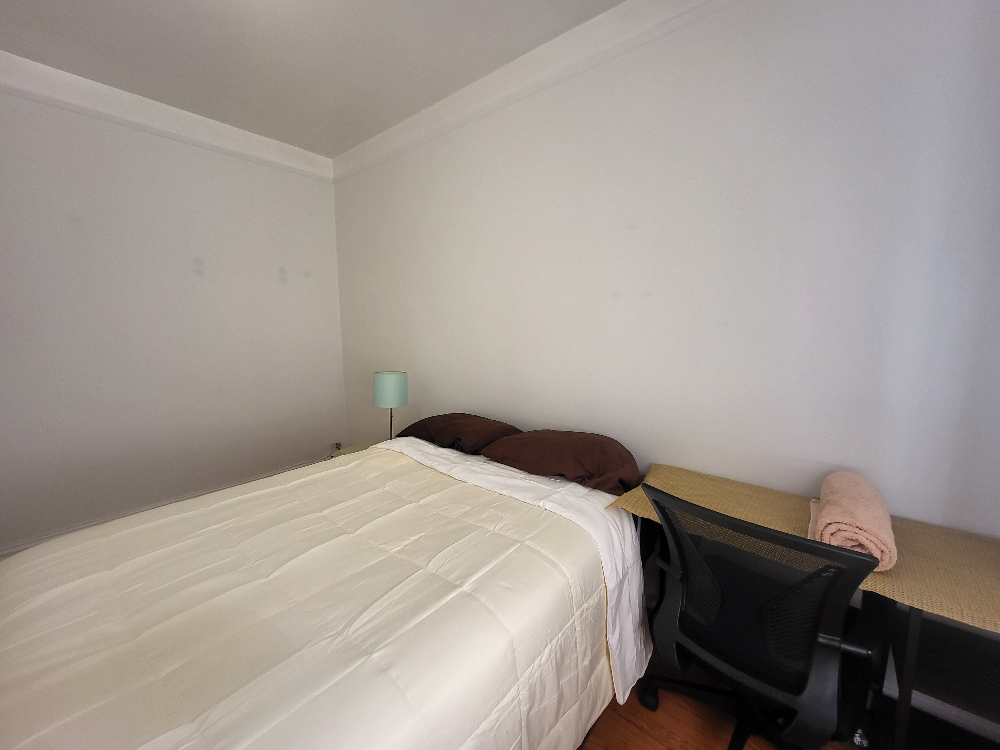

In [12]:
# Example Image

images_clean[0]